# U-Net

U-Net is a convolutional neural network architecture designed for semantic segmentation. 

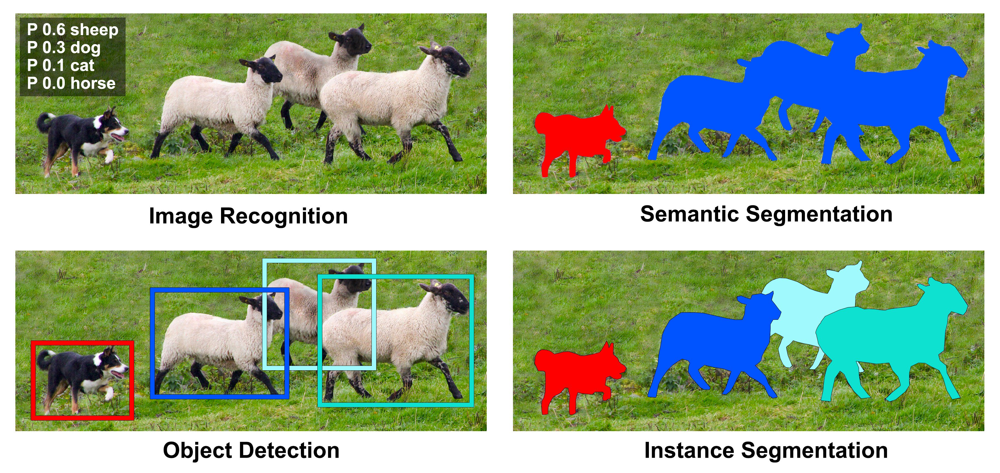

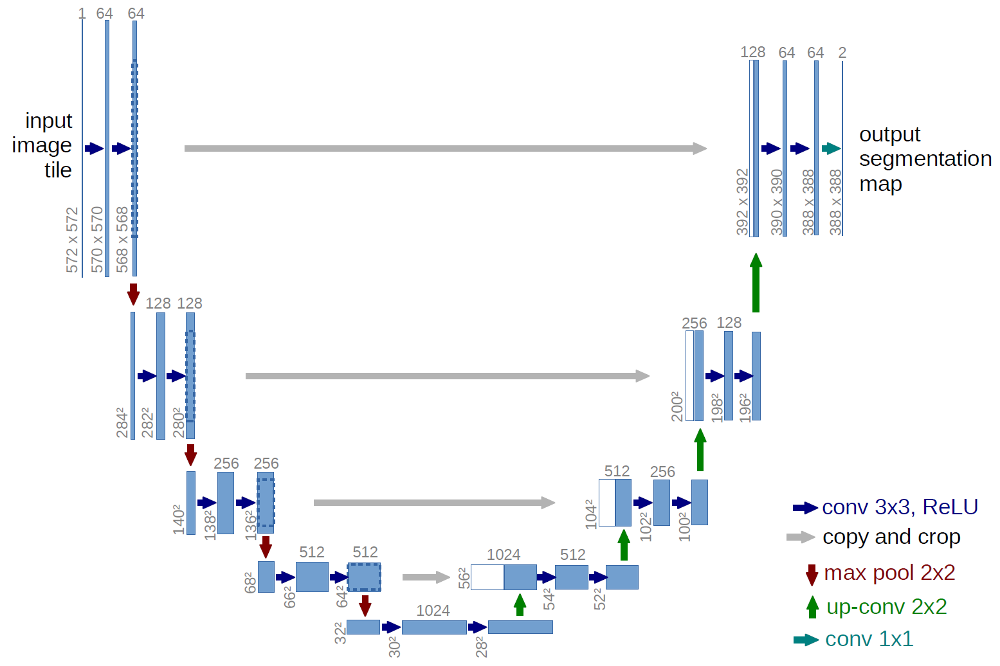

## Build the model

In [1]:
import tensorflow as tf

In [2]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

In [3]:
inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

In [4]:
# we need to convert all integers (img pixels) into floating points
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

In [5]:
# Contraction path

# 16 - number of features
# (3,3) - 
# activation - activation func
# kernel_initializer - set initial weights 
### he_normal - truncated normal distribution
### identity, ortogonal etc.

c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

# pooling
p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansion path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
 
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 128, 128, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  448         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

## Prepare data

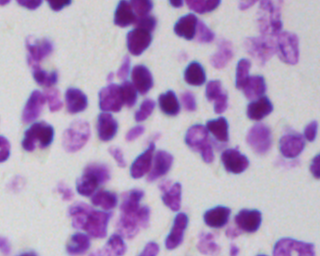

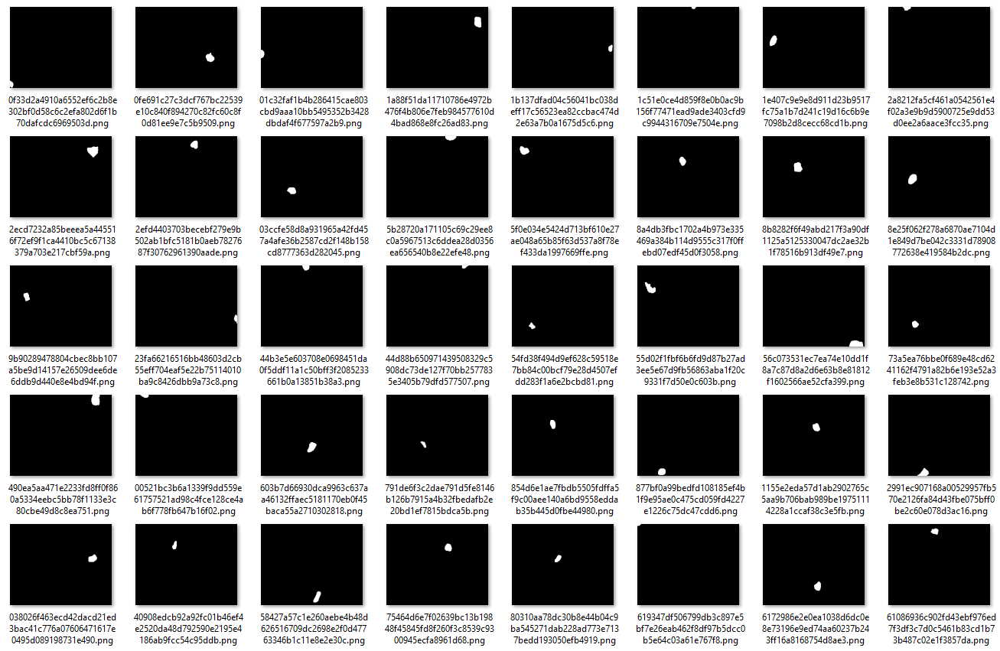

In [1]:
import os
import numpy as np

from tqdm import tqdm 

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

In [7]:
seed = 42
np.random.seed = seed

In [8]:
TRAIN_PATH = './data/stage1_train/'
TEST_PATH = './data/stage1_test/'

In [9]:
# read all filenames

train_ids = next(os.walk(TRAIN_PATH))[1]
test_ids = next(os.walk(TEST_PATH))[1]

In [10]:
train_ids[:3]

['00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552',
 '003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1',
 '00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e']

In [11]:
X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

In [12]:
# Resizing training images and masks
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):   
    path = TRAIN_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]  
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_train[n] = img  #Fill empty X_train with values from img
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)
    for mask_file in next(os.walk(path + '/masks/'))[2]:
        mask_ = imread(path + '/masks/' + mask_file)
        mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant',  
                                      preserve_range=True), axis=-1)
        mask = np.maximum(mask, mask_)  
            
    Y_train[n] = mask 

100%|████████████████████████████████████████████████████████████████████████████████| 670/670 [04:30<00:00,  2.47it/s]


In [13]:
# test images
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
sizes_test = []
print('Resizing test images') 
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img

Resizing test images


100%|██████████████████████████████████████████████████████████████████████████████████| 65/65 [00:01<00:00, 45.95it/s]


In [14]:
import random

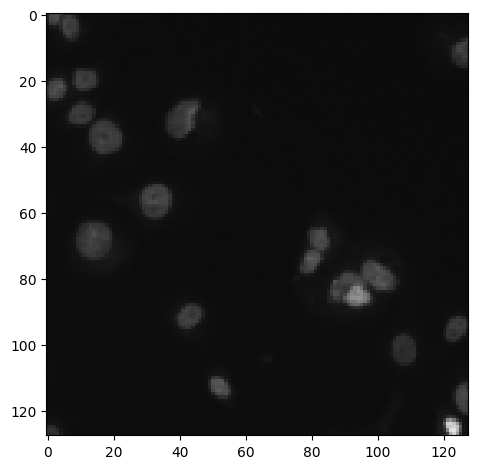

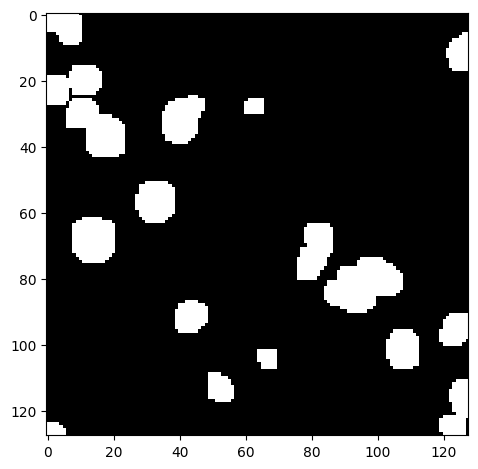

In [15]:
image_x = random.randint(0, len(train_ids))
imshow(X_train[image_x])
plt.show()
imshow(np.squeeze(Y_train[image_x]))
plt.show()

## Fit the model

In [16]:
# define callbacks

checkpointer = tf.keras.callbacks.ModelCheckpoint('u-net.h5', verbose=1, save_best_only=True)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=3, monitor='val_loss')
visualizer = tf.keras.callbacks.TensorBoard(log_dir='logs')

In [17]:
results = model.fit(X_train, Y_train, validation_split=0.1, batch_size=16, epochs=100, callbacks=[checkpointer, early_stopper, visualizer])

Epoch 1/100
38/38 [==============================] - ETA: 0s - loss: 0.5371 - accuracy: 0.7504
Epoch 1: val_loss improved from inf to 0.29750, saving model to u-net.h5
38/38 [==============================] - 56s 1s/step - loss: 0.5371 - accuracy: 0.7504 - val_loss: 0.2975 - val_accuracy: 0.8164
Epoch 2/100
38/38 [==============================] - ETA: 0s - loss: 0.2425 - accuracy: 0.8889
Epoch 2: val_loss improved from 0.29750 to 0.17498, saving model to u-net.h5
38/38 [==============================] - 49s 1s/step - loss: 0.2425 - accuracy: 0.8889 - val_loss: 0.1750 - val_accuracy: 0.9358
Epoch 3/100
38/38 [==============================] - ETA: 0s - loss: 0.1680 - accuracy: 0.9375
Epoch 3: val_loss improved from 0.17498 to 0.15874, saving model to u-net.h5
38/38 [==============================] - 49s 1s/step - loss: 0.1680 - accuracy: 0.9375 - val_loss: 0.1587 - val_accuracy: 0.9424
Epoch 4/100
38/38 [==============================] - ETA: 0s - loss: 0.1438 - accuracy: 0.9446
Epoch 

## Check predict

In [18]:
# get random training sample and perform model on it
idx = random.randint(0, len(X_train))

preds_train = model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)
preds_val = model.predict(X_train[int(X_train.shape[0]*0.9):], verbose=1)
preds_test = model.predict(X_test, verbose=1)

# each pixel is given a value between 0 and 1. Set threshold 0.5 to binarize them.
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)

3/3 [==============================] - 1s 228ms/step


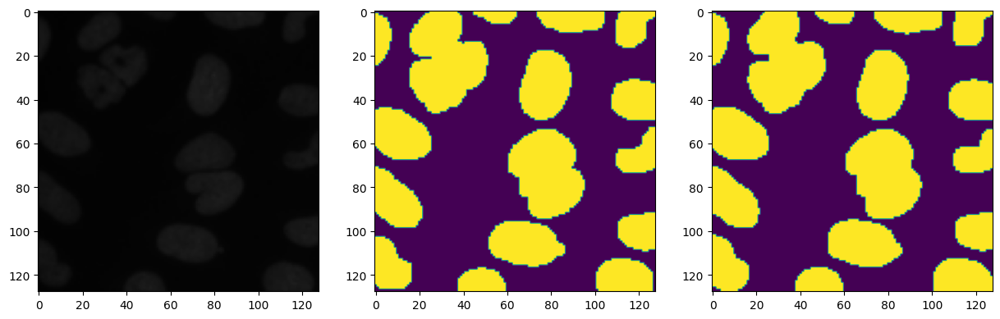

In [19]:
# Perform a sanity check on some random training samples
ix = random.randint(0, len(preds_train_t))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_figheight(15)
fig.set_figwidth(15)

ax1.imshow(X_train[ix])
ax2.imshow(np.squeeze(Y_train[ix]))
ax3.imshow(np.squeeze(preds_train_t[ix]))

plt.show()

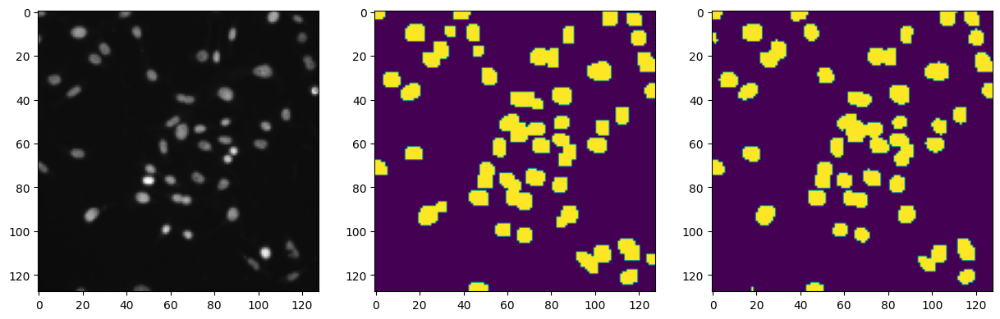

In [20]:
# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_figheight(15)
fig.set_figwidth(15)

ax1.imshow(X_train[int(X_train.shape[0]*0.9):][ix])
ax2.imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
ax3.imshow(np.squeeze(preds_val_t[ix]))

plt.show()

In [2]:
import datetime

In [12]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [21]:
%tensorboard --logdir=logs/